<a href="https://colab.research.google.com/github/windapratiwi215/Algoritama-Genetika-Hibrida/blob/main/SKRIPSI_AO_195314017.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import


In [ ]:
import numpy as np #mengimport library numpy dengan nama np.
import pandas as pd #mengimport library pandas dengan nama pd
import random #mengimport library random.
import matplotlib.pyplot as plt

dataG = pd.read_excel(r'D:\WINDA KULIAH\materi semester 6\Algoritma Optimisasi Kelas A\Praktikum\data guru.xlsx')
#membaca file dataG_latihan.xslx berdasarkan direct yg telah ditentukan
dataS = pd.read_excel(r'D:\WINDA KULIAH\materi semester 6\Algoritma Optimisasi Kelas A\Praktikum\data sekolah.xlsx')
#membaca file dataS_latihan berdasarkan direct yg telah ditentukan
dataJ = pd.read_excel(r'D:\WINDA KULIAH\materi semester 6\Algoritma Optimisasi Kelas A\Praktikum\JARAK.xlsx')
#membaca file JARAK.xlsx berdasarkan direct yg telah ditentukan

idGuru = dataG['Id Guru']
idGuru = idGuru.tolist()
idSekolah = dataS['id']
idSekolah = idSekolah.tolist()


VARIABEL

In [ ]:
k = "awesome" #membuat variabe global jumlah kromosom dalam populasi

In [ ]:
print(dataJ)

       NO_IDG  NO_IDS   Jarak
0           3      45   4.224
1           3      48   5.237
2           3      51   5.127
3           3      56  11.531
4           3      67  10.095
...       ...     ...     ...
67411    3054     509  29.712
67412    3054     528  10.961
67413    3054     541  16.016
67414    3054     551  18.428
67415    3054     552  16.856

[67416 rows x 3 columns]


# FUNCTION LAIN

In [ ]:
def CreateKromosom():#Membangkitkan kromosom awal
  idGuru = dataG['Id Guru']
  idGuru = idGuru.tolist()
  guru = np.zeros(636,dtype=int)

  for i in range (len(idGuru)):
    num = random.randint(0, (len(idGuru)-1))
    guru[i] = idGuru.pop(num)

  jar = np.zeros(636)
  x = 0
  for j in range(len(guru)):
    if(j > 0 and j%6 == 0):
        x = x + 1
    temp = dataJ.loc[(dataJ['NO_IDG'] == guru[j]) & (dataJ['NO_IDS'] == idSekolah[x])]
    temp = temp['Jarak']
    jar[j] = temp

  kromosom = np.array((guru,jar))
  return kromosom


In [ ]:
def CreateKromosomAnak(id):# fungsi memanggil jarak berdasarkan id anak yang telah terbentuk
  jar = np.zeros(636)
  x = 0
  for j in range(len(id)):
    if(j > 0 and j%6 == 0):
      x = x + 1
    temp = dataJ.loc[(dataJ['NO_IDG'] == id[j]) & (dataJ['NO_IDS'] == idSekolah[x])]
    temp = temp['Jarak']
    jar[j] = temp
  kromosom = np.array((id,jar))
  return kromosom

In [ ]:
#fungsi jarak total dalam satu kromosom
def jarak_total(krom):
  jar_total = []
  for i in range(len(krom)) :
    temp = sum(krom[i][1])
    jar_total.append(temp)
  return jar_total

In [ ]:
 # fungsi untuk menghitung fitness
def hitung_fitness(jar):
  maks = max(jar)
  fit = [] # type data array untuk fitness
  for i in jar:
    temp = 2 * maks - i
    fit.append(temp) # temp di tambahkan ke fitness
  return fit # kembalikan nilai fitness


# ROULETTE WHELL

In [ ]:
# fungsi mencari probabilitas fitness
def probabilitas(fit):#Hitung probabilitas
  tot_fit=sum(fit)#total fitness
  #hitung robabilitas
  prob = []
  for i in range(len(fit)):
    probabilitas = fit[i]/tot_fit
    prob.append(probabilitas)
  return prob

In [ ]:
def roulette_whell(probabilitas): # fungsi untuk mencari kemungkinan kromosom yang terpilih menggunakan Roulette_whell
  rentang = np.cumsum(probabilitas)
  angka_random = random.uniform(0,1) #ANGKA RANDOM YG TERPILIH DARI 0 SAMPAI 1 YG TERPILIH ITU ANGKA BERAPA
  for i in range(k):
    if angka_random >= 0 and angka_random <= rentang[0]:
      return 0
      break
    elif angka_random > rentang[i] and angka_random <= rentang[i+1]:
      return i+1
      break

In [ ]:
def get_kromosom_terpilih(probabilitas): # membuat fungsi untuk mengambalikan kromosom yang terpilih dari sama kemungkinan
  kromosom_terpilih = [] # kromosom terpilih bertipe array
  while not kromosom_terpilih or kromosom_terpilih[0] == kromosom_terpilih[1]:
    kromosom_terpilih.clear()
    for i in range(2): #DIRUNNING 2X BAGIAN RETURN ANGKA RANDOM TADI
      temp = roulette_whell(probabilitas)
      kromosom_terpilih.append(temp)
    return kromosom_terpilih

# REPLACE

In [ ]:
def replace_value_IndukAnak(jarak_induk,krom_induk, jarak_anak,krom_anak):#function untuk menggantikan nilai fitness jika fitness anak lebih besar dr fitness awal 10 kromosom
  gabungJarak=np.append(jarak_induk,jarak_anak) #menggabung jarak anak dan jarak induk
  fitGabung= hitung_fitness(gabungJarak)#hitung fitness gabungan

  fitn_induk=fitGabung[0:len(jarak_induk)]#fitness induk dari indek 0 sampai jumlah induk-1
  fitn_anak=fitGabung[len(jarak_induk):]#fitness anak dari indek jumlah induk sampai akhir

  #indek(menunjukan kromosom anak indek keberapa yang akan diseleksi),fit_induk menunjukan fitness awal 10 kromosom awal,krom menunjukan n kromosom awal
  for j in range (len(fitn_anak)):#melakukan perulangan sebanyak jumlah anak
    for i in range(len(fitn_induk)):#dilakukan perulangan sebnayak jumlah fitness awal
      if fitn_induk[i] == min(fitn_induk) :# kondisi jika fitness ke i merupakan nilai minimal maka
        if fitn_anak[j] > fitn_induk[i]:# fit tersebut akan dibandingkan lagi dengan fitness anak, jika fit anak lebih besar dari fitness awal maka
          fitn_induk[i] = fitn_anak[j] # fit anak akan menggantikan nilai fit tersebut
          krom_induk[i] = krom_anak[j]#kromosom anak akan menggantikan kromosom tersebut
          break
  return fitn_induk,krom_induk # return fitn_induk  #mengembalikan nilai fitness dan kromosom

# CROSSOVER

In [ ]:
def Crossover(par1,par2):#single point crossover
  titikBatas = random.randint(0,(len(par1)-1))
  parent1 = list(par1[0:titikBatas])#SEBAGAI CALON ANAK RANDOM YG 1
  parent2 = list(par2[0:titikBatas])#SEBAGAI CALON ANAK RANDOM YG 2
  queue1 = list(par1[titikBatas:len(par1)]) #UNTUK MEMASUKKAN CALON ANAK 1 DARI ANGKA RANDOM 1 SAMPAI SELESAI LALU DIELIMINASI
  queue2 = list(par2[titikBatas:len(par2)]) #UNTUK MEMASUKKAN CALON ANAK 2 DARI ANGKA RANDOM 1 SAMPAI SELESAI LALU DIELIMINASI

  #cek gen yang dikawinkan apakah ada yang sama atau tidak, jika ada yang sama akan dibuang
  def cek(queue,parent):
      join =[]
      removal=[]
      for x in queue:#menyeleksi nilai yang ada di queue pasangan
        for y in parent:#menyeleksi nilai yang ada di parent dirinya sndiri
          if x==y:#kondisi jika nilai didalam kedua element itu sama
            removal.append(x)#maka akan di masukkan kedalam array removal
      for i in range(len(removal)):#menyeleksi nilai di dalam array removal untuk dihapus dari queue
            queue.remove(removal[i])
      join = np.concatenate((parent, queue))#menggabung kedua array queue dan parent
      return join

  cekChild1 = cek(queue2, parent1)
  child1 = cek(par1, cekChild1)#membuat anak 1

  cekChild2 = cek(queue1, parent2)
  child2 = cek(par2, cekChild2)#membuat anak 2

  return child1,child2


In [ ]:
#tes crossover
tes1 = [1,2,3,4,5,6,7,8,9]
tes2 = [4,5,3,6,8,9,7,2,1]
result = Crossover(tes1,tes2)
print(result[0])
print(result[1])


[1 5 3 6 8 9 7 2 4]
[4 2 3 5 6 7 8 9 1]


# MUTASI

In [ ]:
#MUTASI PERBAIKAN
def ScrambleMutasi(id_populasi):
  #menentukan jumlah deret sekolah yang akan discramble n = 10
  n = 10
  #mencari bil random(t2) untuk menentukan deretan sekolah yang akan discramble
  #dalam  penelitian ini terdiri dari 106 sekolah, maka akan dicari titik random dari sekolah 1 sampai (106-n)
  t1 = random.randint(0, len(idSekolah)-n)
  #mencari satu bil random(t1) dari 0-5 sebagai perwakilan index dalam satu sekolah yang akan di scramble
  t2 = random.randint(0, 5)

  # membagi id guru menjadi 106 sekolah dan menyimpannya kemasing-masing array yang baru
  newarr = np.array_split(id_populasi, len(idSekolah))

  #mengambil gen yang akan di scramble
  genScr=[]
  for i in range (t1, t1+n):
    genScr.append(newarr[i][t2])

  # acak gen / proses scramble
  def scrambled(orig):
    dest = orig[:]
    random.shuffle(dest)
    return dest

  afterScr = scrambled(genScr)
  print(t1)
  print(t2)

  #menggantikan gen setelah di scramble
  for i in range(t1,t1+n):
    newarr[i][t2] = afterScr[i-t1]

  #menggabung kembali semua array sekolah menjadi satu populasi
  concatenated = []
  for l in newarr:
    concatenated.extend(l)
  return concatenated


In [ ]:
#tes SwapLS
simpan=[]
for i in range (636):
  simpan.append(i)

result = ScrambleMutasi(simpan)
print(result)


32
4
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 244, 197, 198, 199, 200, 201, 208, 203, 204, 205, 206, 207, 214, 209, 210, 211, 212, 213, 202, 215, 216, 217, 218, 219, 196,

# LOCAL SEARCH

Reverse local search

In [ ]:
def ReverseLS(id_populasi):
    ranNum = []  # membangkitkan 1 nilai random sebagai
    bil = random.randint(0, len(id_populasi)-1)
    ranNum.append(bil)
    print(ranNum)

    posisi1 = list(id_populasi[0:ranNum[0]])
    posisi2 = list(id_populasi[ranNum[0]:len(id_populasi)])
    print(posisi1)
    print(posisi2)

    # balik posisi gen pada posisi2
    afterRev = list(reversed(posisi2))
    print("Resultant new reversed Array:", afterRev)

    # menggabung kedua array queue dan parent
    gabung = np.concatenate((posisi1, afterRev))

    return gabung


In [ ]:
#tes RevLS
tes1 = [1,2,3,4,5,6,7,8,9]

result = ReverseLS(tes1)
print(result)

[7]
[1, 2, 3, 4, 5, 6, 7]
[8, 9]
Resultant new reversed Array: [9, 8]
[1 2 3 4 5 6 7 9 8]


Insert local seacrh

In [ ]:
def InsertLS(id_populasi):  # swap 2 gen bukan 2 kelas
    ranNum = []  # membangkitkan 2 nilai random sebagai tetapan 2 posisi gen yang akan di eksekusi
    for i in range(2):
        bil = random.randint(0, len(id_populasi)-1)
        ranNum.append(bil)
    print(ranNum)


    def rotLeft(a):
        b = []
        for i in range(1, len(a)):
            # menggeser posisi indek ke kiri, dimna array indek 0 diganti dengan nilai indek 1, sampai seterusnya
            b.append(a[i])
        # menggabungkan array b dengan nilai a indek 0(awal) sehingga berada diposisi paling kanan
        b.extend(a[0:1])
        print(a[0])
        return b

    # mengambil array indek dari posisi bil random 1 sampai bil random 2
    if ranNum[0] > ranNum[1]:  # jika bilangan random indek ke 2 lebih besar dari indek ke 1
        eksekusiGen = list(id_populasi[ranNum[1]:ranNum[0]])
        posisi1 = list(id_populasi[0:ranNum[1]])
        posisi2 = list(id_populasi[ranNum[0]:len(id_populasi)])
        afterInsert = rotLeft(eksekusiGen)
        print(afterInsert)
        # menggabung kedua array queue dan parent
        gabung = np.concatenate((posisi1, afterInsert, posisi2))

    elif ranNum[1] > ranNum[0]:
        eksekusiGen = list(id_populasi[ranNum[0]:ranNum[1]])
        posisi1 = list(id_populasi[0:ranNum[0]])
        posisi2 = list(id_populasi[ranNum[1]:len(id_populasi)])
        afterInsert = rotLeft(eksekusiGen)
        print(afterInsert)
        # menggabung kedua array queue dan parent
        gabung = np.concatenate((posisi1, afterInsert, posisi2))
    else:
        print('nilai random sama')
        gabung = id_populasi

    return gabung



In [ ]:
#tes insert
tes1 = [1,2,3,4,5,6,7,8,9]

result = InsertLS(tes1)
print(result)


[2, 0]
1
[2, 1]
[2. 1. 3. 4. 5. 6. 7. 8. 9.]


Swap local seacrh

In [ ]:
def SwapLS(id_populasi):  # Fungsi melakukan mutasi ( swab mutation )
    # membagi id guru menjadi 106 sekolah dan menyimpannya kemasing-masing array yang baru
    newarr = np.array_split(id_populasi, len(idSekolah))

    ranNum = []  # membangkitkan 2 nilai random sebagai tetapan 2 sekolah yang akan di tukar posisinya
    for i in range(2):
        bil = random.randint(0, len(newarr)-1)
        ranNum.append(bil)

    # menukar posisi 2 sekolah  berdasarkan 2 bilangan random(2 sekolah acak)
    newarr[ranNum[0]],  newarr[ranNum[1]] = newarr[ranNum[1]],  newarr[ranNum[0]]

    # menggabung kembali semua array sekolah menjadi satu populasi
    concatenated = []
    for l in newarr:
        concatenated.extend(l)
    return concatenated


In [ ]:
#tes SwapLS
simpan=[]
for i in range (636):
  simpan.append(i)

result = SwapLS(simpan)
print(result)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 330, 331, 332, 333, 334, 335, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

CEK KETURUNAN TERBAIK (AGH)

In [ ]:
def cekKeturunanTerbaik(jar_total, jar_total1):
    gabungJarak1=np.append(jar_total,jar_total1) #menggabung jarak anak dan jarak induk
    fitGabung1= hitung_fitness(gabungJarak1)#hitung fitness gabungan

    fit_induk=fitGabung1[0:len(jar_total)]#fitness induk dari indek 0 sampai jumlah induk-1
    fit_keturunan=fitGabung1[len(jar_total):]#fitness anak dari indek jumlah induk sampai akhir

    fitK_terbaik= max(fit_keturunan)
    for a in fit_keturunan:#cek keturunan terbaik dalam populasi keturunan
        if a==fitK_terbaik:
            fit_keturunan_terbaik=fitK_terbaik

    # (3)	Apakah anak (keturunan terbaik) dalam populasi keturunan juga yang terbaik atas populasi induk saat ini?
    for a in fit_induk:
        if fit_keturunan_terbaik < max(fit_induk):
            simpan=-1
            break
        else:#keturunan terbaik dalam populasi keturunan dan populasi induk
            simpan=fit_keturunan.index(fit_keturunan_terbaik)
            break
    return simpan



In [ ]:
print(cekKeturunanTerbaik([120],[130]))

-1


# MAIN ALGO GENETIK MURNI
SINGLE POINT CROSSOVER, SCRAMBLE MUTASI

In [ ]:
import time

# 1.	[Awal] Inisialisasi parameter berupa jumlah populasi(n), probabilitasi mutasi:crossover, dan jumlah iterasi.
jumlah_iterasi = 10 # memasukkan jumlah iterasi yang akan dilakukan

k = int(input("Masukkan Jumlah Kromosom Awal : "))# memasukkan jumlah kromosom awal memalui keyboard
prob_mutasi = [10, 20, 50, 75, 100, 250, 500]# memasukkan kelipatan berapa iterasi akan melakukan mutasi

arrayIterasi = []  # menyimpan nilai iterasi setiap iterasi dilakukan & digunakan untuk mencetak nilai kolom iterasi pada tabel
arrayProbMutasi = []  # menyimpan nilai probabilitas mutasi setiap iterasi dilakukan & digunakan untuk mencetak nilai kolom probabilitas mutasi pada tabel
jarakTotalTebaik_simpan = []# menyimpan  semua jarak total dari semua iterasi dan semua mutasi
jarakTotalTebaik_keseluruhan = []# menyimpan jarak total terbaik dari setiap kombinasi
kromosomTebaik_simpan = []# menyimpan semua kromosom dari semua iterasi dan semua mutasi
id_krom_terbaik = []  # menyimpan id kromosom terbaik dari semua percobaan kombinasi
arrayTime=[]# menyimpan waktu program berjalan dalam setiap kombinasi probabilitas mutasi

for p in prob_mutasi:  # melakukan perulangan untuk nilai probabilitas mutasi untuk dieksekusi
    print('')
    print('Iterasi : '+str(jumlah_iterasi) +
        ' & probabilitas mutasi : ' + str(p))

    # 2.	[Populasi Awal] Membangkitkan populasi awal sebanyak n kromosom.
    kromosom = []
    for i in range(k):  # membuat kromsom awal sebanyak nilai k(jumlah kromosom awall yang dimasukkan lewat keyboard)
        kromosom.append(CreateKromosom())

    # 3.	[Populasi baru] Mengulang langkah-langkah berikut untuk membuat populasi baru.
    jarakTotalTerbaik = []  # menyimpan jarak total terbaik tiap iterasi
    kromosomTerbaik = []  # menyimpan kromosom terbaik tiap iterasi
    start = time.time() #setting waktu dimulainya program
    for i in range(jumlah_iterasi):

        # 1)	[Fitness] Menghitung nilai fitness setiap kromosom dalam populasi
        jar_total = jarak_total(kromosom)  # hitung jarak total dari n kromosom
        fit = hitung_fitness(jar_total)  # hitung fitness n kromosom
        print('')
        print("\tIterasi ke-" + str(i+1))

        # 2)	[Seleksi] Memilih kromosom parent untuk proses reproduksi
        probabilitas_seleksi = probabilitas(fit)
        kromosom_terpilih = get_kromosom_terpilih(probabilitas_seleksi)  # GET KROMOSOM YG TERPILIH
        # 3)	[Regenerasi] Melakukan proses crossover atau mutasi
        kromosom_anak = []

        if i % p == 0:# jika itersi kelipatan dari p(probabilitas mutasi) maka
            bentuk_anak = ScrambleMutasi(kromosom[kromosom_terpilih[0]][0])# Lakukan mutasi (scramble mutation) untuk membentuk anak baru
            kromosom_anak.append(CreateKromosomAnak(bentuk_anak))
        else:
            id_parent1 = list(kromosom[kromosom_terpilih[0]][0])# id parent 1 berdasarkan 2 kromosom terpilih
            id_parent2 = list(kromosom[kromosom_terpilih[1]][0])# id parent 2 berdasarkan 2 kromosom terpilih
            bentuk_anak = Crossover(id_parent1, id_parent2)# Lakukan crossover  untuk membentuk anak baru
            for i in range(2):
                kromosom_anak.append(CreateKromosomAnak(bentuk_anak[i]))

        # 4)	[Evaluasi keturunan] Menempatkan keturunan baru kedalam populasi jika nilai fitness keturunan lebih besar dari fitness dalam populasi sekarang.

        jar_total1= jarak_total(kromosom_anak)
        dfJar_total1 = pd.DataFrame(np.row_stack(jar_total1))
        print("Jarak Kromosom Anak")
        print(dfJar_total1)
        print("Jarak Kromosom Induk")
        dfJar_total2 = pd.DataFrame(np.row_stack(jar_total))
        print(dfJar_total2)

        replace=replace_value_IndukAnak(jar_total,kromosom,jar_total1,kromosom_anak)
        fit_akhir = replace[0]# fitness akhir diambil dari return replace pada indek ke 0
        kromosom_akhir = replace[1]# kromosom akhir diambil dari return reolace pada indek ke 1

        for i in range(len(kromosom)):# mengupdate kromosom awal dengan kromosom baru hasil setelah seleksi fitnes
            kromosom[i] = kromosom_akhir[i]
        for i in range(len(fit)):# mengupdate fitness awal dengan fitness baru hasil setelah seleksi fitnes
            fit[i] = fit_akhir[i]

        fitness_terbaik = max(fit)

        for i in range(len(kromosom)):# mencetak id koromosom terbaik
            if fit_akhir[i] == fitness_terbaik:
                temp = kromosom[i][0]
                temp_konv = np.round(temp).astype(int)
                id_krom_terbaik.append(temp_konv)

        jar_total2 = jarak_total(kromosom)# mencari total jarak total dari kromosom yang telah di update

        print("Jarak Total kromosom terbaik")
        print(min(jar_total2))# cetak jarak total minimal dari semua kromosom

        end = time.time()
        endTime = end - start# menyimpan waktu berahir iterasi untuk kombinasi probabilitas tertentu

        jarakTotalTerbaik.append(min(jar_total2))# memasukkan semua jarak total terbaik ditiap iterasi kedalam array jarakTotalTerbaik

    # 4.	[Pergantian populasi] Menggunakan populasi baru untuk proses genetika selanjutnya
    # 5.	[Pemeriksaan pemberhentian] Jika kondisi pemberhentian tercapai, maka proses genetika berahir.
        #END FOR
    # 6.	[Perulangan] Jika kondisi di langkah 5 tidak tercapai, maka masuk lagi ke langkah 2.
    jarakTotalTebaik_simpan.append(jarakTotalTerbaik)#menyimpan semua jarak total dari semua iterasi dan semua mutasi
    kromosomTebaik_simpan.append(id_krom_terbaik)#menyimpan  id kromosom dari semua iterasi dan semua mutasi

    # membuat tabel iterasi, probabilitas mutasi dan jarak total terkecilnya
    jarakTotalTebaik_keseluruhan.append(min(jarakTotalTerbaik))
    arrayIterasi.append(jumlah_iterasi)
    arrayProbMutasi.append(p)
    arrayTime.append(endTime)

    dict = {"Iterasi": arrayIterasi,
            "Probabiitas Mutasi ": arrayProbMutasi,
            "Jarak Terpendek": jarakTotalTebaik_keseluruhan,
            "Waktu": arrayTime}
    df = pd.DataFrame(dict)
    print(df)
    # mencetak tabel jarak terpendek dari kombinasi beberapa iterasi dan probabilitas mutasi kedalam file excel
    df.to_excel(
        r'D:\WINDA KULIAH\materi semester 8\program\TABEL\PERCOBAAN DIGUNAKAN\PERCOBAAN3_K=40; I=500; PM=all\TABEL JARAK DARI KOMBINASI AGM.xlsx', index=False)

#Buat grafik antara Jarak total terbaik dan jumlah iterasi
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
# ax.plot(fitnessTerbaik)
for i in range(len(prob_mutasi)-1, -1, -1):
    ax.plot(jarakTotalTebaik_simpan[len(jarakTotalTebaik_simpan)-(i+1)], label = "Prob Mutasi = "+str(prob_mutasi[len(prob_mutasi)-(i+1)]))

# set label X dan Y dan judul
ax.set_xlabel('Iterasi')
ax.set_ylabel('Jarak')
ax.set_title('Jarak Total Minimum Tiap Iterasi \nIterasi ' + str(jumlah_iterasi) +
             ' & Semua Probabilitasi Mutasi ' + ' & Jumlah Kromosom : ' + str(k))
plt.legend()
plt.show()

# mencetak jarak terpendek dari semua kombinasi
print('')
print('*******************************************************************')
print('Jarak Total Terpendek dari Semua Kombinasi :')
print(min(jarakTotalTebaik_keseluruhan))
print('*******************************************************************')

# Menyimpan kromosom dan jarak total terbaik ke dalam excel
fit_keseluruhan = hitung_fitness(jarakTotalTebaik_keseluruhan)#hitung fitness dari semua jarak total terbaik keseluruhan

fit_keseluruhan_maks= max(fit_keseluruhan)
id_krom_final = []
for i in range(len(kromosomTebaik_simpan)):
    if fit_keseluruhan[i] == fit_keseluruhan_maks:
            temp=kromosomTebaik_simpan[i][0]
            id_krom_final.append(temp)
df_krom_final=pd.DataFrame(id_krom_final)
#mencetak 1 kromosom terbaik kedalam file excel
df_krom_final.to_excel(r'D:\WINDA KULIAH\materi semester 8\program\TABEL\PERCOBAAN DIGUNAKAN\PERCOBAAN3_K=40; I=500; PM=all\ID KROMOSOM FINAL AGM.xlsx', index=False)
print('Id Kromosom Final : ')
print(df_krom_final)

# MAIN ALGO GENETIK HIBRIDA

SINGLE POINT CROSSOVER, SCRAMBLE MUTASI,REVERSE LOCAL SEARCH


Iterasi : 500 & probabilitas mutasi : 10

	Iterasi ke-1
35
1
Jarak Kromosom Anak
           0
0  12152.956
Jarak Kromosom Induk
            0
0   12121.053
1   12135.159
2   12412.233
3   12611.643
4   12225.879
5   12340.422
6   12430.372
7   12435.669
8   12166.649
9   12308.953
10  12519.809
11  12459.462
12  12484.405
13  12438.616
14  12472.575
15  12574.192
16  12111.273
17  12480.930
18  12382.376
19  12688.975
20  12660.676
21  12245.138
22  12410.055
23  12291.947
24  12480.086
25  12118.341
26  12151.304
27  11886.897
28  12192.014
29  12321.810
30  12441.391
31  12071.303
32  12533.855
33  12061.633
34  12134.378
35  12480.007
36  12144.400
37  12064.265
38  12586.092
39  12366.084
CEKK KETURUNAN
-1
No Local Search
Jarak Total kromosom terbaik
11886.896999999997

	Iterasi ke-2
Jarak Kromosom Anak
           0
0  12174.194
1  12160.916
Jarak Kromosom Induk
            0
0   12121.053
1   12135.159
2   12412.233
3   12611.643
4   12225.879
5   12340.422
6   12430.372
7   1243

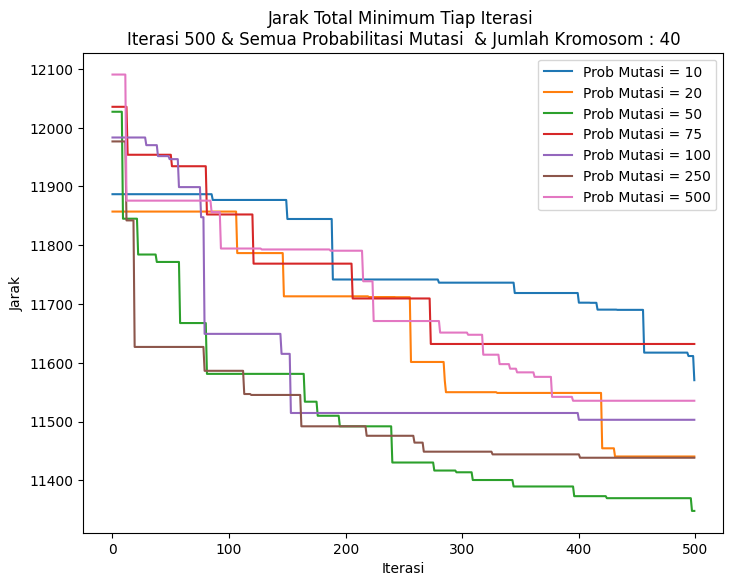


*******************************************************************
Jarak Total Terpendek dari Semua Kombinasi :
11347.900000000003
*******************************************************************
Id Kromosom Final : 
    0     1     2     3    4     5    6     7     8     9    ...   626  627  \
0  1752  1397  2516  2642  728  2173  266  1289  1330  1251  ...  2237  855   

    628   629   630   631  632   633   634   635  
0  2724  1339  2224  1830  438  2200  3023  3004  

[1 rows x 636 columns]


In [ ]:
import time


# 1.	[Awal] Inisialisasi parameter berupa jumlah populasi(n), probabilitasi mutasi:crossover, dan jumlah iterasi.
jumlah_iterasi = 500 # memasukkan jumlah iterasi yang akan dilakukan

k = int(input("Masukkan Jumlah Kromosom Awal : "))# memasukkan jumlah kromosom awal memalui keyboard
prob_mutasi = [10, 20, 50, 75, 100, 250, 500]# memasukkan kelipatan berapa iterasi akan melakukan mutasi

arrayIterasi = []  # menyimpan nilai iterasi setiap iterasi dilakukan & digunakan untuk mencetak nilai kolom iterasi pada tabel
arrayProbMutasi = []  # menyimpan nilai probabilitas mutasi setiap iterasi dilakukan & digunakan untuk mencetak nilai kolom probabilitas mutasi pada tabel
jarakTotalTebaik_simpan = []# menyimpan  semua jarak total  dari semua iterasi dan semua mutasi
jarakTotalTebaik_keseluruhan = []# menyimpan jarak total terbaik dari setiap kombinasi
kromosomTebaik_simpan = []# menyimpan  semua kromosom dari semua iterasi dan semua mutasi
id_krom_terbaik = []  # menyimpan id kromosom terbaik dari semua percobaan kombinasi
arrayTime=[]# menyimpan waktu program berjalan dalam setiap kombinasi probabilitas mutasi

for p in prob_mutasi:  # melakukan perulangan untuk nilai probabilitas mutasi untuk dieksekusi
    print('')
    print('Iterasi : '+str(jumlah_iterasi) +
        ' & probabilitas mutasi : ' + str(p))

    # 2.	[Populasi Awal] Membangkitkan populasi awal sebanyak n kromosom.
    kromosom = []
    for i in range(k):  # membuat kromsom awal sebanyak nilai k(jumlah kromosom awall yang dimasukkan lewat keyboard)
        kromosom.append(CreateKromosom())

    # 3.	[Populasi baru] Mengulang langkah-langkah berikut untuk membuat populasi baru.
    jarakTotalTerbaik = []  # menyimpan jarak total terbaik tiap iterasi
    kromosomTerbaik = []  # menyimpan kromosom terbaik tiap iterasi
    start = time.time() #setting waktu dimulainya program
    for i in range(jumlah_iterasi):

        # 1)	[Fitness] Menghitung nilai fitness setiap kromosom dalam populasi
        jar_total = jarak_total(kromosom)  # hitung jarak total dari n kromosom
        fit = hitung_fitness(jar_total)  # hitung fitness n kromosom
        print('')
        print("\tIterasi ke-" + str(i+1))

        # 2)	[Seleksi] Memilih kromosom parent untuk proses reproduksi
        probabilitas_seleksi = probabilitas(fit)
        kromosom_terpilih = get_kromosom_terpilih(probabilitas_seleksi)  # GET KROMOSOM YG TERPILIH
        # 3)	[Regenerasi] Melakukan proses crossover atau mutasi
        kromosom_anak = []

        if i % p == 0:# jika itersi kelipatan dari p(probabilitas mutasi) maka
            bentuk_anak = ScrambleMutasi(kromosom[kromosom_terpilih[0]][0])# Lakukan mutasi (scramble mutation) untuk membentuk anak baru
            kromosom_anak.append(CreateKromosomAnak(bentuk_anak))
        else:
            id_parent1 = list(kromosom[kromosom_terpilih[0]][0])# id parent 1 berdasarkan 2 kromosom terpilih
            id_parent2 = list(kromosom[kromosom_terpilih[1]][0])# id parent 2 berdasarkan 2 kromosom terpilih
            bentuk_anak = Crossover(id_parent1, id_parent2)# Lakukan crossover  untuk membentuk anak baru
            for i in range(2):
                kromosom_anak.append(CreateKromosomAnak(bentuk_anak[i]))

        # 4)	[Evaluasi keturunan] Menempatkan keturunan baru kedalam populasi jika nilai fitness keturunan lebih besar dari fitness dalam populasi sekarang.

        jar_total1= jarak_total(kromosom_anak)
        dfJar_total1 = pd.DataFrame(np.row_stack(jar_total1))
        print("Jarak Kromosom Anak")
        print(dfJar_total1)
        print("Jarak Kromosom Induk")
        dfJar_total2 = pd.DataFrame(np.row_stack(jar_total))
        print(dfJar_total2)

               # ===============================================================================HIBRIDA====================================================================
        # (1)	Menghasilkan individu anak sebagai populasi keturunan
        # (2)	Mengevaluasi fungsi fitness dari setiap individu dalam populasi keturunan.
        # (3)	Apakah anak (keturunan terbaik) dalam populasi keturunan juga yang terbaik atas populasi induk saat ini?
        cek_keturunan = cekKeturunanTerbaik(jar_total, jar_total1)

        kromosom_keturunan_terbaik=kromosom_anak[cek_keturunan]
        print('CEKK KETURUNAN')
        print(cek_keturunan)
        # (4)	Jika tidak, langsung kelangkah 4), artinya tidak ada pencarian lokal di generasi ini
        if cek_keturunan < 0:
            replace = replace_value_IndukAnak(jar_total, kromosom, jar_total1, kromosom_anak)#replace jarak terbesar yang ada diinduk diganti jarak terpendek dianak
            print('No Local Search')
        else:
            print('Yes Local Search')
        # (5)	Jika ya, maka lakukan pencarian lokal pada anak (keturunan terbaik)
            kromosom_cucu=[]#pencarian local menggunakan REVERSE
            bentuk_cucu = ReverseLS(kromosom_keturunan_terbaik[0])#id kromosom terpilih pada kromosom anak
        # (6)	Menghasilkan individu cucu dari pencarian lokal
            kromosom_cucu.append(CreateKromosomAnak(bentuk_cucu))
        # (7)	Menghitung fitness individu cucu
            jar_totalCucu = jarak_total(kromosom_cucu)

            dfJar_totalCucu = pd.DataFrame(np.row_stack(jar_totalCucu))
            print("Jarak Kromosom Cucu")
            print(dfJar_totalCucu)
            print("Jarak Kromosom Anak ")
            dfJar_totalCucu2 = pd.DataFrame(np.row_stack(jar_total1))
            print(dfJar_totalCucu2)

            print(jar_total1[cek_keturunan])
            print(jar_totalCucu[0])

            jarak_keturunan_terbaik=[]
            jarak_keturunan_terbaik.append(jar_total1[cek_keturunan])

            cek_cucu = cekKeturunanTerbaik(jarak_keturunan_terbaik, jar_totalCucu) #cek cucu dan anak
            print(cek_cucu)


        # (8)	Membandingkan fitness individu anak (keturunan terbaik) dan cucu
            if cek_cucu > -1: #jika kromosom cucu lebih baik
                kromosom_anak[cek_keturunan] = kromosom_cucu[0]#gantikan kromosom keturunan terbaik dnegan kromosom cucu
                replace=replace_value_IndukAnak(jar_total,kromosom,jar_total1,kromosom_anak)
            else:
                replace=replace_value_IndukAnak(jar_total,kromosom,jar_total1,kromosom_anak)

       #======================================END HIBRIDA============================================================================================
        fit_akhir = replace[0]# fitness akhir diambil dari return replace pada indek ke 0
        kromosom_akhir = replace[1]# kromosom akhir diambil dari return reolace pada indek ke 1

        for i in range(len(kromosom)):# mengupdate kromosom awal dengan kromosom baru hasil setelah seleksi fitnes
            kromosom[i] = kromosom_akhir[i]
        for i in range(len(fit)):# mengupdate fitness awal dengan fitness baru hasil setelah seleksi fitnes
            fit[i] = fit_akhir[i]

        fitness_terbaik = max(fit)

        for i in range(len(kromosom)):# mencetak id koromosom terbaik
            if fit_akhir[i] == fitness_terbaik:
                temp = kromosom[i][0]
                temp_konv = np.round(temp).astype(int)
                id_krom_terbaik.append(temp_konv)

        jar_total2 = jarak_total(kromosom)# mencari total jarak total dari kromosom yang telah di update

        print("Jarak Total kromosom terbaik")
        print(min(jar_total2))# cetak jarak total minimal dari semua kromosom

        end = time.time()
        endTime = end - start# menyimpan waktu berahir iterasi untuk kombinasi probabilitas tertentu

        jarakTotalTerbaik.append(min(jar_total2))# memasukkan semua jarak total terbaik ditiap iterasi kedalam array jarakTotalTerbaik

    # 4.	[Pergantian populasi] Menggunakan populasi baru untuk proses genetika selanjutnya
    # 5.	[Pemeriksaan pemberhentian] Jika kondisi pemberhentian tercapai, maka proses genetika berahir.
        #END FOR
    # 6.	[Perulangan] Jika kondisi di langkah 5 tidak tercapai, maka masuk lagi ke langkah 2.
    jarakTotalTebaik_simpan.append(jarakTotalTerbaik)#menyimpan semua jarak total dari semua iterasi dan semua mutasi
    kromosomTebaik_simpan.append(id_krom_terbaik)#menyimpan  id kromosom dari semua iterasi dan semua mutasi

    # membuat tabel iterasi, probabilitas mutasi dan jarak total terkecilnya
    jarakTotalTebaik_keseluruhan.append(min(jarakTotalTerbaik))
    arrayIterasi.append(jumlah_iterasi)
    arrayProbMutasi.append(p)
    arrayTime.append(endTime)

    dict = {"Iterasi": arrayIterasi,
            "Probabiitas Mutasi ": arrayProbMutasi,
            "Jarak Terpendek": jarakTotalTebaik_keseluruhan,
            "Waktu": arrayTime}
    df = pd.DataFrame(dict)
    print(df)
    # mencetak tabel jarak terpendek dari kombinasi beberapa iterasi dan probabilitas mutasi kedalam file excel
    df.to_excel(
        r'D:\WINDA KULIAH\materi semester 8\program\TABEL\PERCOBAAN DIGUNAKAN\PERCOBAAN3_K=40; I=500; PM=all\TABEL JARAK DARI KOMBINASI AGH-RLS.xlsx', index=False)

#Buat grafik antara Jarak total terbaik dan jumlah iterasi
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
# ax.plot(fitnessTerbaik)
for i in range(len(prob_mutasi)-1, -1, -1):
    ax.plot(jarakTotalTebaik_simpan[len(jarakTotalTebaik_simpan)-(i+1)], label = "Prob Mutasi = "+str(prob_mutasi[len(prob_mutasi)-(i+1)]))

# set label X dan Y dan judul
ax.set_xlabel('Iterasi')
ax.set_ylabel('Jarak')
ax.set_title('Jarak Total Minimum Tiap Iterasi \nIterasi ' + str(jumlah_iterasi) +
             ' & Semua Probabilitasi Mutasi ' + ' & Jumlah Kromosom : ' + str(k))
plt.legend()
plt.show()

# mencetak jarak terpendek dari semua kombinasi
print('')
print('*******************************************************************')
print('Jarak Total Terpendek dari Semua Kombinasi :')
print(min(jarakTotalTebaik_keseluruhan))
print('*******************************************************************')

# Menyimpan kromosom dan jarak total terbaik ke dalam excel
fit_keseluruhan = hitung_fitness(jarakTotalTebaik_keseluruhan)#hitung fitness dari semua jarak total terbaik keseluruhan

fit_keseluruhan_maks= max(fit_keseluruhan)
id_krom_final = []
for i in range(len(kromosomTebaik_simpan)):
    if fit_keseluruhan[i] == fit_keseluruhan_maks:
            temp=kromosomTebaik_simpan[i][0]
            id_krom_final.append(temp)
df_krom_final=pd.DataFrame(id_krom_final)
#mencetak 1 kromosom terbaik kedalam file excel
df_krom_final.to_excel(r'D:\WINDA KULIAH\materi semester 8\program\TABEL\PERCOBAAN DIGUNAKAN\PERCOBAAN3_K=40; I=500; PM=all\ID KROMOSOM FINAL AGH-RLS.xlsx', index=False)
print('Id Kromosom Final : ')
print(df_krom_final)

SINGLE POINT CROSSOVER, SCRAMBLE MUTASI,INSERT LOCAL SEARCH


Iterasi : 500 & probabilitas mutasi : 10

	Iterasi ke-1
2
39
Jarak Kromosom Anak
           0
0  12202.287
Jarak Kromosom Induk
            0
0   12597.158
1   12173.974
2   12399.367
3   12215.414
4   12628.664
5   12214.341
6   12303.138
7   12456.142
8   12456.728
9   12459.520
10  12283.969
11  12261.464
12  12687.236
13  12322.458
14  12200.388
15  11959.034
16  12369.588
17  12111.360
18  12385.308
19  12274.689
CEKK KETURUNAN
-1
No Local Search
Jarak Total kromosom terbaik
11959.03400000001

	Iterasi ke-2
Jarak Kromosom Anak
           0
0  12492.341
1  12012.972
Jarak Kromosom Induk
            0
0   12597.158
1   12173.974
2   12399.367
3   12215.414
4   12628.664
5   12214.341
6   12303.138
7   12456.142
8   12456.728
9   12459.520
10  12283.969
11  12261.464
12  12202.287
13  12322.458
14  12200.388
15  11959.034
16  12369.588
17  12111.360
18  12385.308
19  12274.689
CEKK KETURUNAN
-1
No Local Search
Jarak Total kromosom terbaik
11959.03400000001

	Iterasi ke-3
Jarak Kromo

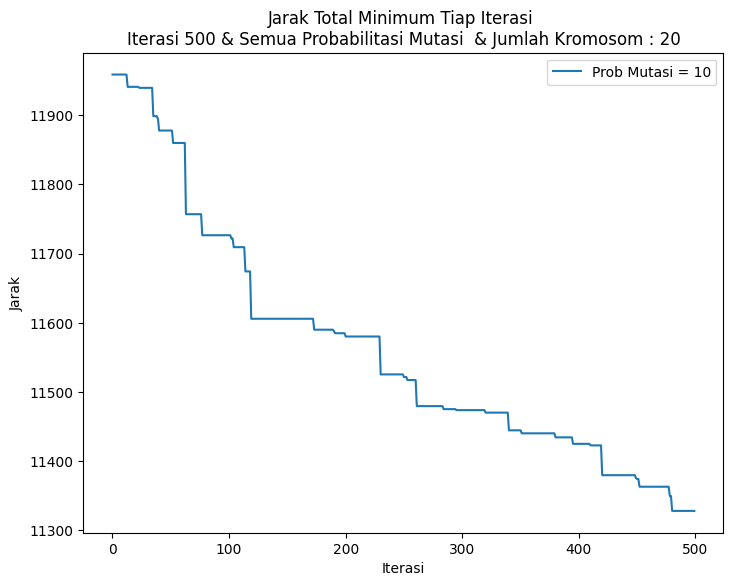


*******************************************************************
Jarak Total Terpendek dari Semua Kombinasi :
11327.561000000018
*******************************************************************
Id Kromosom Final : 
    0    1     2     3     4     5     6     7    8     9    ...  626   627  \
0  1062   21  1535  2425  2727  1351  1163  1397  297  2996  ...  803  1803   

   628   629  630  631   632   633  634  635  
0  961  1405  567  438  1452  1064  215  956  

[1 rows x 636 columns]


In [ ]:
import time


# 1.	[Awal] Inisialisasi parameter berupa jumlah populasi(n), probabilitasi mutasi:crossover, dan jumlah iterasi.
jumlah_iterasi = 500 # memasukkan jumlah iterasi yang akan dilakukan

k = int(input("Masukkan Jumlah Kromosom Awal : "))# memasukkan jumlah kromosom awal memalui keyboard
prob_mutasi = [10, 20, 50, 75, 100, 250, 500]# memasukkan kelipatan berapa iterasi akan melakukan mutasi

arrayIterasi = []  # menyimpan nilai iterasi setiap iterasi dilakukan & digunakan untuk mencetak nilai kolom iterasi pada tabel
arrayProbMutasi = []  # menyimpan nilai probabilitas mutasi setiap iterasi dilakukan & digunakan untuk mencetak nilai kolom probabilitas mutasi pada tabel
jarakTotalTebaik_simpan = []# menyimpan  semua jarak total  dari semua iterasi dan semua mutasi
jarakTotalTebaik_keseluruhan = []# menyimpan jarak total terbaik dari setiap kombinasi
kromosomTebaik_simpan = []# menyimpan  semua kromosom dari semua iterasi dan semua mutasi
id_krom_terbaik = []  # menyimpan id kromosom terbaik dari semua percobaan kombinasi
arrayTime=[]# menyimpan waktu program berjalan dalam setiap kombinasi probabilitas mutasi

for p in prob_mutasi:  # melakukan perulangan untuk nilai probabilitas mutasi untuk dieksekusi
    print('')
    print('Iterasi : '+str(jumlah_iterasi) +
        ' & probabilitas mutasi : ' + str(p))

    # 2.	[Populasi Awal] Membangkitkan populasi awal sebanyak n kromosom.
    kromosom = []
    for i in range(k):  # membuat kromsom awal sebanyak nilai k(jumlah kromosom awall yang dimasukkan lewat keyboard)
        kromosom.append(CreateKromosom())

    # 3.	[Populasi baru] Mengulang langkah-langkah berikut untuk membuat populasi baru.
    jarakTotalTerbaik = []  # menyimpan jarak total terbaik tiap iterasi
    kromosomTerbaik = []  # menyimpan kromosom terbaik tiap iterasi
    start = time.time() #setting waktu dimulainya program
    for i in range(jumlah_iterasi):

        # 1)	[Fitness] Menghitung nilai fitness setiap kromosom dalam populasi
        jar_total = jarak_total(kromosom)  # hitung jarak total dari n kromosom
        fit = hitung_fitness(jar_total)  # hitung fitness n kromosom
        print('')
        print("\tIterasi ke-" + str(i+1))

        # 2)	[Seleksi] Memilih kromosom parent untuk proses reproduksi
        probabilitas_seleksi = probabilitas(fit)
        kromosom_terpilih = get_kromosom_terpilih(probabilitas_seleksi)  # GET KROMOSOM YG TERPILIH
        # 3)	[Regenerasi] Melakukan proses crossover atau mutasi
        kromosom_anak = []

        if i % p == 0:# jika itersi kelipatan dari p(probabilitas mutasi) maka
            bentuk_anak = ScrambleMutasi(kromosom[kromosom_terpilih[0]][0])# Lakukan mutasi (scramble mutation) untuk membentuk anak baru
            kromosom_anak.append(CreateKromosomAnak(bentuk_anak))
        else:
            id_parent1 = list(kromosom[kromosom_terpilih[0]][0])# id parent 1 berdasarkan 2 kromosom terpilih
            id_parent2 = list(kromosom[kromosom_terpilih[1]][0])# id parent 2 berdasarkan 2 kromosom terpilih
            bentuk_anak = Crossover(id_parent1, id_parent2)# Lakukan crossover  untuk membentuk anak baru
            for i in range(2):
                kromosom_anak.append(CreateKromosomAnak(bentuk_anak[i]))

        # 4)	[Evaluasi keturunan] Menempatkan keturunan baru kedalam populasi jika nilai fitness keturunan lebih besar dari fitness dalam populasi sekarang.

        jar_total1= jarak_total(kromosom_anak)
        dfJar_total1 = pd.DataFrame(np.row_stack(jar_total1))
        print("Jarak Kromosom Anak")
        print(dfJar_total1)
        print("Jarak Kromosom Induk")
        dfJar_total2 = pd.DataFrame(np.row_stack(jar_total))
        print(dfJar_total2)

               # ===============================================================================HIBRIDA====================================================================
        # (1)	Menghasilkan individu anak sebagai populasi keturunan
        # (2)	Mengevaluasi fungsi fitness dari setiap individu dalam populasi keturunan.
        # (3)	Apakah anak (keturunan terbaik) dalam populasi keturunan juga yang terbaik atas populasi induk saat ini?
        cek_keturunan = cekKeturunanTerbaik(jar_total, jar_total1)

        kromosom_keturunan_terbaik=kromosom_anak[cek_keturunan]
        print('CEKK KETURUNAN')
        print(cek_keturunan)
        # (4)	Jika tidak, langsung kelangkah 4), artinya tidak ada pencarian lokal di generasi ini
        if cek_keturunan < 0:
            replace = replace_value_IndukAnak(jar_total, kromosom, jar_total1, kromosom_anak)#replace jarak terbesar yang ada diinduk diganti jarak terpendek dianak
            print('No Local Search')
        else:
            print('Yes Local Search')
        # (5)	Jika ya, maka lakukan pencarian lokal pada anak (keturunan terbaik)
            kromosom_cucu=[]#pencarian local menggunakan INSERT
            bentuk_cucu = InsertLS(kromosom_keturunan_terbaik[0])#id kromosom terpilih pada kromosom anak
        # (6)	Menghasilkan individu cucu dari pencarian lokal
            kromosom_cucu.append(CreateKromosomAnak(bentuk_cucu))
        # (7)	Menghitung fitness individu cucu
            jar_totalCucu = jarak_total(kromosom_cucu)

            dfJar_totalCucu = pd.DataFrame(np.row_stack(jar_totalCucu))
            print("Jarak Kromosom Cucu")
            print(dfJar_totalCucu)
            print("Jarak Kromosom Anak ")
            dfJar_totalCucu2 = pd.DataFrame(np.row_stack(jar_total1))
            print(dfJar_totalCucu2)

            print(jar_total1[cek_keturunan])
            print(jar_totalCucu[0])

            jarak_keturunan_terbaik=[]
            jarak_keturunan_terbaik.append(jar_total1[cek_keturunan])

            cek_cucu = cekKeturunanTerbaik(jarak_keturunan_terbaik, jar_totalCucu) #cek cucu dan anak
            print(cek_cucu)


        # (8)	Membandingkan fitness individu anak (keturunan terbaik) dan cucu
            if cek_cucu > -1: #jika kromosom cucu lebih baik
                kromosom_anak[cek_keturunan] = kromosom_cucu[0]#gantikan kromosom keturunan terbaik dnegan kromosom cucu
                replace=replace_value_IndukAnak(jar_total,kromosom,jar_total1,kromosom_anak)
            else:
                replace=replace_value_IndukAnak(jar_total,kromosom,jar_total1,kromosom_anak)

       #======================================END HIBRIDA============================================================================================
        fit_akhir = replace[0]# fitness akhir diambil dari return replace pada indek ke 0
        kromosom_akhir = replace[1]# kromosom akhir diambil dari return reolace pada indek ke 1

        for i in range(len(kromosom)):# mengupdate kromosom awal dengan kromosom baru hasil setelah seleksi fitnes
            kromosom[i] = kromosom_akhir[i]
        for i in range(len(fit)):# mengupdate fitness awal dengan fitness baru hasil setelah seleksi fitnes
            fit[i] = fit_akhir[i]

        fitness_terbaik = max(fit)

        for i in range(len(kromosom)):# mencetak id koromosom terbaik
            if fit_akhir[i] == fitness_terbaik:
                temp = kromosom[i][0]
                temp_konv = np.round(temp).astype(int)
                id_krom_terbaik.append(temp_konv)

        jar_total2 = jarak_total(kromosom)# mencari total jarak total dari kromosom yang telah di update

        print("Jarak Total kromosom terbaik")
        print(min(jar_total2))# cetak jarak total minimal dari semua kromosom

        end = time.time()
        endTime = end - start# menyimpan waktu berahir iterasi untuk kombinasi probabilitas tertentu

        jarakTotalTerbaik.append(min(jar_total2))# memasukkan semua jarak total terbaik ditiap iterasi kedalam array jarakTotalTerbaik

    # 4.	[Pergantian populasi] Menggunakan populasi baru untuk proses genetika selanjutnya
    # 5.	[Pemeriksaan pemberhentian] Jika kondisi pemberhentian tercapai, maka proses genetika berahir.
        #END FOR
    # 6.	[Perulangan] Jika kondisi di langkah 5 tidak tercapai, maka masuk lagi ke langkah 2.
    jarakTotalTebaik_simpan.append(jarakTotalTerbaik)#menyimpan semua jarak total dari semua iterasi dan semua mutasi
    kromosomTebaik_simpan.append(id_krom_terbaik)#menyimpan  id kromosom dari semua iterasi dan semua mutasi

    # membuat tabel iterasi, probabilitas mutasi dan jarak total terkecilnya
    jarakTotalTebaik_keseluruhan.append(min(jarakTotalTerbaik))
    arrayIterasi.append(jumlah_iterasi)
    arrayProbMutasi.append(p)
    arrayTime.append(endTime)

    dict = {"Iterasi": arrayIterasi,
            "Probabiitas Mutasi ": arrayProbMutasi,
            "Jarak Terpendek": jarakTotalTebaik_keseluruhan,
            "Waktu": arrayTime}
    df = pd.DataFrame(dict)
    print(df)
    # mencetak tabel jarak terpendek dari kombinasi beberapa iterasi dan probabilitas mutasi kedalam file excel
    df.to_excel(
        r'D:\WINDA KULIAH\materi semester 8\program\TABEL\PERCOBAAN DIGUNAKAN\PERCOBAAN3_K=40; I=500; PM=all\TABEL JARAK DARI KOMBINASI AGH-ILS.xlsx', index=False)

#Buat grafik antara Jarak total terbaik dan jumlah iterasi
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
# ax.plot(fitnessTerbaik)
for i in range(len(prob_mutasi)-1, -1, -1):
    ax.plot(jarakTotalTebaik_simpan[len(jarakTotalTebaik_simpan)-(i+1)], label = "Prob Mutasi = "+str(prob_mutasi[len(prob_mutasi)-(i+1)]))

# set label X dan Y dan judul
ax.set_xlabel('Iterasi')
ax.set_ylabel('Jarak')
ax.set_title('Jarak Total Minimum Tiap Iterasi \nIterasi ' + str(jumlah_iterasi) +
             ' & Semua Probabilitasi Mutasi ' + ' & Jumlah Kromosom : ' + str(k))
plt.legend()
plt.show()

# mencetak jarak terpendek dari semua kombinasi
print('')
print('*******************************************************************')
print('Jarak Total Terpendek dari Semua Kombinasi :')
print(min(jarakTotalTebaik_keseluruhan))
print('*******************************************************************')

# Menyimpan kromosom dan jarak total terbaik ke dalam excel
fit_keseluruhan = hitung_fitness(jarakTotalTebaik_keseluruhan)#hitung fitness dari semua jarak total terbaik keseluruhan

fit_keseluruhan_maks= max(fit_keseluruhan)
id_krom_final = []
for i in range(len(kromosomTebaik_simpan)):
    if fit_keseluruhan[i] == fit_keseluruhan_maks:
            temp=kromosomTebaik_simpan[i][0]
            id_krom_final.append(temp)
df_krom_final=pd.DataFrame(id_krom_final)
#mencetak 1 kromosom terbaik kedalam file excel
df_krom_final.to_excel(r'D:\WINDA KULIAH\materi semester 8\program\TABEL\PERCOBAAN DIGUNAKAN\PERCOBAAN3_K=40; I=500; PM=all\ID KROMOSOM FINAL AGH-ILS.xlsx', index=False)
print('Id Kromosom Final : ')
print(df_krom_final)

SINGLE POINT CROSSOVER, SCRAMBLE MUTASI,SWAP LOCAL SEARCH


Iterasi : 500 & probabilitas mutasi : 10

	Iterasi ke-1
5
60
Jarak Kromosom Anak
           0
0  12718.002
Jarak Kromosom Induk
            0
0   12479.587
1   12399.905
2   12263.874
3   12337.146
4   12517.824
5   12353.692
6   12379.103
7   12140.301
8   12063.735
9   12492.575
10  12190.262
11  12440.238
12  12366.036
13  12067.248
14  12060.410
15  12315.053
16  12111.727
17  12265.645
18  12661.507
19  12338.553
CEKK KETURUNAN
-1
No Local Search
Jarak Total kromosom terbaik
12060.409999999996

	Iterasi ke-2
Jarak Kromosom Anak
           0
0  12422.426
1  12022.515
Jarak Kromosom Induk
            0
0   12479.587
1   12399.905
2   12263.874
3   12337.146
4   12517.824
5   12353.692
6   12379.103
7   12140.301
8   12063.735
9   12492.575
10  12190.262
11  12440.238
12  12366.036
13  12067.248
14  12060.410
15  12315.053
16  12111.727
17  12265.645
18  12661.507
19  12338.553
CEKK KETURUNAN
1
Yes Local Search
Jarak Kromosom Cucu
           0
0  12029.402
Jarak Kromosom Anak 
     

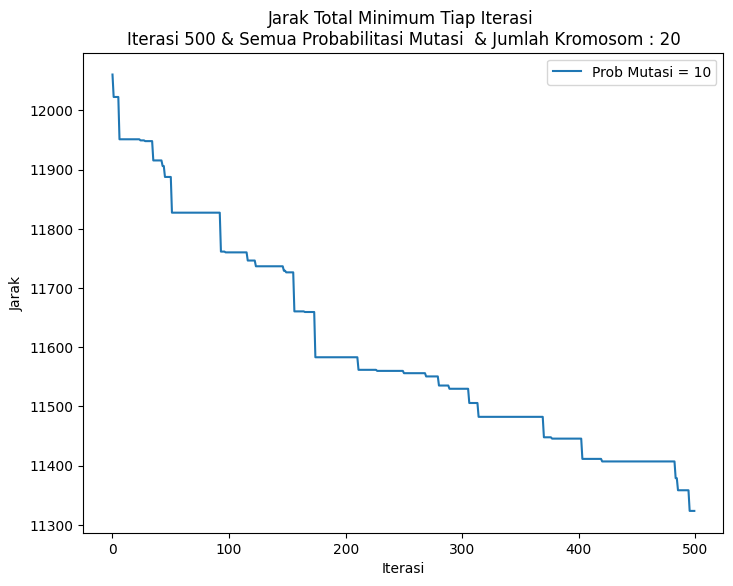


*******************************************************************
Jarak Total Terpendek dari Semua Kombinasi :
11323.414999999994
*******************************************************************
Id Kromosom Final : 
    0     1     2     3    4     5     6    7     8     9    ...   626  627  \
0  1999  2095  1323  2894  601  2881  1345  309  1614  1954  ...  1020  549   

   628   629   630   631   632   633   634   635  
0  154  2362  1769  1398  1100  2516  2754  2799  

[1 rows x 636 columns]


In [ ]:
import time


# 1.	[Awal] Inisialisasi parameter berupa jumlah populasi(n), probabilitasi mutasi:crossover, dan jumlah iterasi.
jumlah_iterasi = 500 # memasukkan jumlah iterasi yang akan dilakukan

k = int(input("Masukkan Jumlah Kromosom Awal : "))# memasukkan jumlah kromosom awal memalui keyboard
prob_mutasi = [10, 20, 50, 75, 100, 250, 500]# memasukkan kelipatan berapa iterasi akan melakukan mutasi

arrayIterasi = []  # menyimpan nilai iterasi setiap iterasi dilakukan & digunakan untuk mencetak nilai kolom iterasi pada tabel
arrayProbMutasi = []  # menyimpan nilai probabilitas mutasi setiap iterasi dilakukan & digunakan untuk mencetak nilai kolom probabilitas mutasi pada tabel
jarakTotalTebaik_simpan = []# menyimpan  semua jarak total  dari semua iterasi dan semua mutasi
jarakTotalTebaik_keseluruhan = []# menyimpan jarak total terbaik dari setiap kombinasi
kromosomTebaik_simpan = []# menyimpan  semua kromosom dari semua iterasi dan semua mutasi
id_krom_terbaik = []  # menyimpan id kromosom terbaik dari semua percobaan kombinasi
arrayTime=[]# menyimpan waktu program berjalan dalam setiap kombinasi probabilitas mutasi

for p in prob_mutasi:  # melakukan perulangan untuk nilai probabilitas mutasi untuk dieksekusi
    print('')
    print('Iterasi : '+str(jumlah_iterasi) +
        ' & probabilitas mutasi : ' + str(p))

    # 2.	[Populasi Awal] Membangkitkan populasi awal sebanyak n kromosom.
    kromosom = []
    for i in range(k):  # membuat kromsom awal sebanyak nilai k(jumlah kromosom awall yang dimasukkan lewat keyboard)
        kromosom.append(CreateKromosom())

    # 3.	[Populasi baru] Mengulang langkah-langkah berikut untuk membuat populasi baru.
    jarakTotalTerbaik = []  # menyimpan jarak total terbaik tiap iterasi
    kromosomTerbaik = []  # menyimpan kromosom terbaik tiap iterasi
    start = time.time() #setting waktu dimulainya program
    for i in range(jumlah_iterasi):

        # 1)	[Fitness] Menghitung nilai fitness setiap kromosom dalam populasi
        jar_total = jarak_total(kromosom)  # hitung jarak total dari n kromosom
        fit = hitung_fitness(jar_total)  # hitung fitness n kromosom
        print('')
        print("\tIterasi ke-" + str(i+1))

        # 2)	[Seleksi] Memilih kromosom parent untuk proses reproduksi
        probabilitas_seleksi = probabilitas(fit)
        kromosom_terpilih = get_kromosom_terpilih(probabilitas_seleksi)  # GET KROMOSOM YG TERPILIH
        # 3)	[Regenerasi] Melakukan proses crossover atau mutasi
        kromosom_anak = []

        if i % p == 0:# jika itersi kelipatan dari p(probabilitas mutasi) maka
            bentuk_anak = ScrambleMutasi(kromosom[kromosom_terpilih[0]][0])# Lakukan mutasi (scramble mutation) untuk membentuk anak baru
            kromosom_anak.append(CreateKromosomAnak(bentuk_anak))
        else:
            id_parent1 = list(kromosom[kromosom_terpilih[0]][0])# id parent 1 berdasarkan 2 kromosom terpilih
            id_parent2 = list(kromosom[kromosom_terpilih[1]][0])# id parent 2 berdasarkan 2 kromosom terpilih
            bentuk_anak = Crossover(id_parent1, id_parent2)# Lakukan crossover  untuk membentuk anak baru
            for i in range(2):
                kromosom_anak.append(CreateKromosomAnak(bentuk_anak[i]))

        # 4)	[Evaluasi keturunan] Menempatkan keturunan baru kedalam populasi jika nilai fitness keturunan lebih besar dari fitness dalam populasi sekarang.

        jar_total1= jarak_total(kromosom_anak)
        dfJar_total1 = pd.DataFrame(np.row_stack(jar_total1))
        print("Jarak Kromosom Anak")
        print(dfJar_total1)
        print("Jarak Kromosom Induk")
        dfJar_total2 = pd.DataFrame(np.row_stack(jar_total))
        print(dfJar_total2)

               # ===============================================================================HIBRIDA====================================================================
        # (1)	Menghasilkan individu anak sebagai populasi keturunan
        # (2)	Mengevaluasi fungsi fitness dari setiap individu dalam populasi keturunan.
        # (3)	Apakah anak (keturunan terbaik) dalam populasi keturunan juga yang terbaik atas populasi induk saat ini?
        cek_keturunan = cekKeturunanTerbaik(jar_total, jar_total1)

        kromosom_keturunan_terbaik=kromosom_anak[cek_keturunan]
        print('CEKK KETURUNAN')
        print(cek_keturunan)
        # (4)	Jika tidak, langsung kelangkah 4), artinya tidak ada pencarian lokal di generasi ini
        if cek_keturunan < 0:
            replace = replace_value_IndukAnak(jar_total, kromosom, jar_total1, kromosom_anak)#replace jarak terbesar yang ada diinduk diganti jarak terpendek dianak
            print('No Local Search')
        else:
            print('Yes Local Search')
        # (5)	Jika ya, maka lakukan pencarian lokal pada anak (keturunan terbaik)
            kromosom_cucu=[]#pencarian local menggunakan SWAP
            bentuk_cucu = SwapLS(kromosom_keturunan_terbaik[0])#id kromosom terpilih pada kromosom anak
        # (6)	Menghasilkan individu cucu dari pencarian lokal
            kromosom_cucu.append(CreateKromosomAnak(bentuk_cucu))
        # (7)	Menghitung fitness individu cucu
            jar_totalCucu = jarak_total(kromosom_cucu)

            dfJar_totalCucu = pd.DataFrame(np.row_stack(jar_totalCucu))
            print("Jarak Kromosom Cucu")
            print(dfJar_totalCucu)
            print("Jarak Kromosom Anak ")
            dfJar_totalCucu2 = pd.DataFrame(np.row_stack(jar_total1))
            print(dfJar_totalCucu2)

            print(jar_total1[cek_keturunan])
            print(jar_totalCucu[0])

            jarak_keturunan_terbaik=[]
            jarak_keturunan_terbaik.append(jar_total1[cek_keturunan])

            cek_cucu = cekKeturunanTerbaik(jarak_keturunan_terbaik, jar_totalCucu) #cek cucu dan anak
            print(cek_cucu)


        # (8)	Membandingkan fitness individu anak (keturunan terbaik) dan cucu
            if cek_cucu > -1: #jika kromosom cucu lebih baik
                kromosom_anak[cek_keturunan] = kromosom_cucu[0]#gantikan kromosom keturunan terbaik dnegan kromosom cucu
                replace=replace_value_IndukAnak(jar_total,kromosom,jar_total1,kromosom_anak)
            else:
                replace=replace_value_IndukAnak(jar_total,kromosom,jar_total1,kromosom_anak)

       #======================================END HIBRIDA============================================================================================
        fit_akhir = replace[0]# fitness akhir diambil dari return replace pada indek ke 0
        kromosom_akhir = replace[1]# kromosom akhir diambil dari return reolace pada indek ke 1

        for i in range(len(kromosom)):# mengupdate kromosom awal dengan kromosom baru hasil setelah seleksi fitnes
            kromosom[i] = kromosom_akhir[i]
        for i in range(len(fit)):# mengupdate fitness awal dengan fitness baru hasil setelah seleksi fitnes
            fit[i] = fit_akhir[i]

        fitness_terbaik = max(fit)

        for i in range(len(kromosom)):# mencetak id koromosom terbaik
            if fit_akhir[i] == fitness_terbaik:
                temp = kromosom[i][0]
                temp_konv = np.round(temp).astype(int)
                id_krom_terbaik.append(temp_konv)

        jar_total2 = jarak_total(kromosom)# mencari total jarak total dari kromosom yang telah di update

        print("Jarak Total kromosom terbaik")
        print(min(jar_total2))# cetak jarak total minimal dari semua kromosom

        end = time.time()
        endTime = end - start# menyimpan waktu berahir iterasi untuk kombinasi probabilitas tertentu

        jarakTotalTerbaik.append(min(jar_total2))# memasukkan semua jarak total terbaik ditiap iterasi kedalam array jarakTotalTerbaik

    # 4.	[Pergantian populasi] Menggunakan populasi baru untuk proses genetika selanjutnya
    # 5.	[Pemeriksaan pemberhentian] Jika kondisi pemberhentian tercapai, maka proses genetika berahir.
        #END FOR
    # 6.	[Perulangan] Jika kondisi di langkah 5 tidak tercapai, maka masuk lagi ke langkah 2.
    jarakTotalTebaik_simpan.append(jarakTotalTerbaik)#menyimpan semua jarak total dari semua iterasi dan semua mutasi
    kromosomTebaik_simpan.append(id_krom_terbaik)#menyimpan  id kromosom dari semua iterasi dan semua mutasi

    # membuat tabel iterasi, probabilitas mutasi dan jarak total terkecilnya
    jarakTotalTebaik_keseluruhan.append(min(jarakTotalTerbaik))
    arrayIterasi.append(jumlah_iterasi)
    arrayProbMutasi.append(p)
    arrayTime.append(endTime)

    dict = {"Iterasi": arrayIterasi,
            "Probabiitas Mutasi ": arrayProbMutasi,
            "Jarak Terpendek": jarakTotalTebaik_keseluruhan,
            "Waktu": arrayTime}
    df = pd.DataFrame(dict)
    print(df)
    # mencetak tabel jarak terpendek dari kombinasi beberapa iterasi dan probabilitas mutasi kedalam file excel
    df.to_excel(
        r'D:\WINDA KULIAH\materi semester 8\program\TABEL\PERCOBAAN DIGUNAKAN\PERCOBAAN3_K=40; I=500; PM=all\TABEL JARAK DARI KOMBINASI AGH-SLS.xlsx', index=False)

#Buat grafik antara Jarak total terbaik dan jumlah iterasi
fig = plt.figure()
ax = fig.add_axes([0, 0, 1, 1])
# ax.plot(fitnessTerbaik)
for i in range(len(prob_mutasi)-1, -1, -1):
    ax.plot(jarakTotalTebaik_simpan[len(jarakTotalTebaik_simpan)-(i+1)], label = "Prob Mutasi = "+str(prob_mutasi[len(prob_mutasi)-(i+1)]))

# set label X dan Y dan judul
ax.set_xlabel('Iterasi')
ax.set_ylabel('Jarak')
ax.set_title('Jarak Total Minimum Tiap Iterasi \nIterasi ' + str(jumlah_iterasi) +
             ' & Semua Probabilitasi Mutasi ' + ' & Jumlah Kromosom : ' + str(k))
plt.legend()
plt.show()

# mencetak jarak terpendek dari semua kombinasi
print('')
print('*******************************************************************')
print('Jarak Total Terpendek dari Semua Kombinasi :')
print(min(jarakTotalTebaik_keseluruhan))
print('*******************************************************************')

# Menyimpan kromosom dan jarak total terbaik ke dalam excel
fit_keseluruhan = hitung_fitness(jarakTotalTebaik_keseluruhan)#hitung fitness dari semua jarak total terbaik keseluruhan

fit_keseluruhan_maks= max(fit_keseluruhan)
id_krom_final = []
for i in range(len(kromosomTebaik_simpan)):
    if fit_keseluruhan[i] == fit_keseluruhan_maks:
            temp=kromosomTebaik_simpan[i][0]
            id_krom_final.append(temp)
df_krom_final=pd.DataFrame(id_krom_final)
#mencetak 1 kromosom terbaik kedalam file excel
df_krom_final.to_excel(r'D:\WINDA KULIAH\materi semester 8\program\TABEL\PERCOBAAN DIGUNAKAN\PERCOBAAN3_K=40; I=500; PM=all\ID KROMOSOM FINAL AGH-SLS.xlsx', index=False)
print('Id Kromosom Final : ')
print(df_krom_final)